# Image-to-Image Translation by CycleGAN

In this notebook, we're going to define and train a CycleGAN to read in an image from a set $X$ and transform it so that it looks as if it belongs in set $Y$. Specifically, we'll look at a set of images of [Yosemite national park](https://en.wikipedia.org/wiki/Yosemite_National_Park) taken either during the summer of winter. The seasons are our two domains!

>The objective will be to train generators that learn to transform an image from domain $X$ into an image that looks like it came from domain $Y$ (and vice versa). 

Some examples of image data in both sets are pictured below.

<img src='../assets/XY_season_images.png' width=80% />

### Unpaired Training Data

These images do not come with labels, but CycleGANs give us a way to learn the mapping between one image domain and another using an **unsupervised** approach. A CycleGAN is designed for image-to-image translation and it learns from unpaired training data. This means that in order to train a generator to translate images from domain $X$ to domain $Y$, we do not have to have exact correspondences between individual images in those domains. For example, in [the paper that introduced CycleGANs](https://arxiv.org/abs/1703.10593), the authors are able to translate between images of horses and zebras, even though there are no images of a zebra in exactly the same position as a horse or with exactly the same background, etc. Thus, CycleGANs enable learning a mapping from one domain $X$ to another domain $Y$ without having to find perfectly-matched, training pairs!

<img src='../assets/horse2zebra.jpg' width=50% />

### CycleGAN and Notebook Structure

A CycleGAN is made of two types of networks: **discriminators, and generators**. In this example, the discriminators are responsible for classifying images as real or fake (for both $X$ and $Y$ kinds of images). The generators are responsible for generating convincing, fake images for both kinds of images. 

This notebook will detail the steps you should take to define and train such a CycleGAN. 

>1. You'll load in the image data using PyTorch's DataLoader class to efficiently read in images from a specified directory. 
2. Then, you'll be tasked with defining the CycleGAN architecture according to provided specifications. You'll define the discriminator and the generator models.
3. You'll complete the training cycle by calculating the adversarial and cycle consistency losses for the generator and discriminator network and completing a number of training epochs. *It's suggested that you enable GPU usage for training.*
4. Finally, you'll evaluate your model by looking at the loss over time and looking at sample, generated images.


---

## Load and Visualize the Data

We'll first load in and visualize the training data, importing the necessary libraries to do so.

In [1]:
# loading in and transforming data
import os
from typing import Callable

import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms

# visualizing data
import matplotlib.pyplot as plt
import numpy as np
import warnings

%matplotlib inline

### DataLoaders

The `get_data_loader` function returns training and test DataLoaders that can load data efficiently and in specified batches. The function has the following parameters:
* `image_type`: `summer` or `winter`,  the names of the directories where the X and Y images are stored
* `image_dir`: name of the main image directory, which holds all training and test images
* `image_size`: resized, square image dimension (all images will be resized to this dim)
* `batch_size`: number of images in one batch of data

The test data is strictly for feeding to our generators, later on, so we can visualize some generated samples on fixed, test data.

You can see that this function is also responsible for making sure our images are of the right, square size (128x128x3) and converted into Tensor image types.

**It's suggested that you use the default values of these parameters.**

Note: If you are trying this code on a different set of data, you may get better results with larger `image_size` and `batch_size` parameters. If you change the `batch_size`, make sure that you create complete batches in the training loop otherwise you may get an error when trying to save sample data. 

In [2]:
def get_data_loader(image_type: str, 
                    transform: Callable,
                    image_dir: str = 'summer2winter_yosemite', 
                    batch_size: int = 16, 
                    num_workers: int = 0):
    """Returns training and test data loaders for a given image type, either 'summer' or 'winter'. 
       These images will be resized to 128x128x3, by default, converted into Tensors, and normalized.
    """
    
    # get training and test directories
    image_path = image_dir
    train_path = os.path.join(image_path, image_type)
    test_path = os.path.join(image_path, 'test_{}'.format(image_type))

    # define datasets using ImageFolder
    train_dataset = datasets.ImageFolder(train_path, transform)
    test_dataset = datasets.ImageFolder(test_path, transform)

    # create and return DataLoaders
    train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

    return train_loader, test_loader

In [3]:
from torchvision.transforms import Compose, Resize, ToTensor, Normalize 

In [5]:
# Create train and test dataloaders for images from the two domains X and Y
# image_type = directory names for our data
# resize and normalize the images
image_size = 128
transform = Compose([Resize(image_size), # resize to 128x128
                     ToTensor(),
                     Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    
dataloader_X, test_dataloader_X = get_data_loader(image_type='summer', 
                                                  transform=transform,
                                                  image_dir='./summer2winter_yosemite/',)
dataloader_Y, test_dataloader_Y = get_data_loader(image_type='winter', 
                                                  transform=transform,
                                                  image_dir='./summer2winter_yosemite/',)

## Display some Training Images

Below we provide a function `imshow` that reshape some given images and converts them to NumPy images so that they can be displayed by `plt`. This cell should display a grid that contains a batch of image data from set $X$.

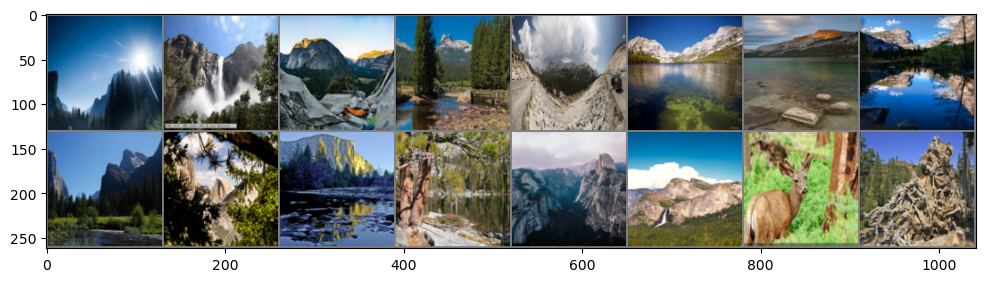

In [7]:
# helper imshow function
def imshow(img):
    npimg = img.numpy()
    npimg = (((npimg + 1) * 255) / 2).astype(np.uint8)
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    

# get some images from X
dataiter = iter(dataloader_X)
# the "_" is a placeholder for no labels
images, _ = next(dataiter)

# show images
fig = plt.figure(figsize=(12, 8))
imshow(torchvision.utils.make_grid(images))

#### visualize a batch of images from set $Y$.

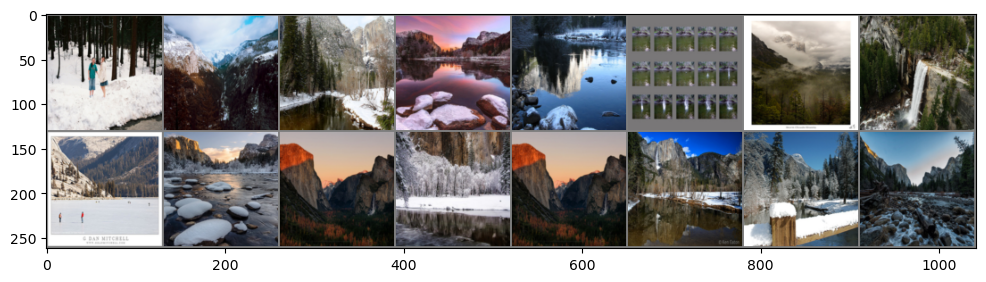

In [8]:
# get some images from Y
dataiter = iter(dataloader_Y)
images, _ = next(dataiter)

# show images
fig = plt.figure(figsize=(12,8))
imshow(torchvision.utils.make_grid(images))

---
## Define the Model

A CycleGAN is made of two discriminator and two generator networks.

## Discriminators

The discriminators, $D_X$ and $D_Y$, in this CycleGAN are convolutional neural networks that see an image and attempt to classify it as real or fake. In this case, real is indicated by an output close to 1 and fake as close to 0. The discriminators have the following architecture:

<img src='../assets/discriminator_layers.png' width=80% />

This network sees a 128x128x3 image, and passes it through 5 convolutional layers that downsample the image by a factor of 2. The first four convolutional layers have a BatchNorm and ReLu activation function applied to their output, and the last acts as a classification layer that outputs one value.

### Convolutional Helper Function

To define the discriminators, you're expected to use the provided `conv` function, which creates a convolutional layer + an optional batch norm layer.

In [9]:
import torch.nn as nn

In [10]:
class ConvBlock(nn.Module):
    """
    A convolutional block is made of 3 layers: Conv -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - stride: stride of the conv layer
    - use_bn: whether to use batch normalization or not
    - use_activation: whether to use an activation function or not
    """
    def __init__(self, 
                 in_channels: int, 
                 out_channels: int, 
                 kernel_size: int,
                 stride: int = 1,
                 padding: int = 1,
                 use_bn: bool = True,
                 use_activation: bool = True):
        super(ConvBlock, self).__init__()
        
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=stride, padding=padding, bias=False)
        
        self.use_bn = use_bn
        if self.use_bn:
            self.bn = nn.BatchNorm2d(out_channels)
            
        self.use_activation = use_activation
        if self.use_activation:
            self.act = nn.ReLU()
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        if self.use_bn:
            x = self.bn(x)
        if self.use_activation:
            x = self.act(x)
        return x

### Define the Discriminator Architecture

Your task is to fill in the `__init__` function with the specified 5 layer conv net architecture. Both $D_X$ and $D_Y$ have the same architecture, so we only need to define one class, and later instantiate two discriminators. 
> It's recommended that you use a **kernel size of 4x4** and use that to determine the correct stride and padding size for each layer. [This Stanford resource](http://cs231n.github.io/convolutional-networks/#conv) may also help in determining stride and padding sizes.

* Define your convolutional layers in `__init__`
* Then fill in the forward behavior of the network

The `forward` function defines how an input image moves through the discriminator, and the most important thing is to pass it through your convolutional layers in order, with a **ReLu** activation function applied to all but the last layer.

You should **not** apply a sigmoid activation function to the output, here, and that is because we are planning on using a squared error loss for training. And you can read more about this loss function, later in the notebook.

In [11]:
class Discriminator(nn.Module):
    
    def __init__(self, conv_dim=64):
        super(Discriminator, self).__init__()

        # Define all convolutional layers
        # Should accept an RGB image as input and output a single value

        # Convolutional layers, increasing in depth
        # first layer has *no* batchnorm
        self.conv1 = ConvBlock(3, conv_dim, 4, stride=2, use_bn=False) # x, y = 64, depth 64
        self.conv2 = ConvBlock(conv_dim, conv_dim*2, 4, stride=2, ) # (32, 32, 128)
        self.conv3 = ConvBlock(conv_dim*2, conv_dim*4, 4, stride=2) # (16, 16, 256)
        self.conv4 = ConvBlock(conv_dim*4, conv_dim*8, 4, stride=2) # (8, 8, 512)
        # Classification layer
        self.conv5 = ConvBlock(conv_dim*8, 1, 8, stride=1, padding=0, use_bn=False, use_activation=False)
        

    def forward(self, x):
        # relu applied to all conv layers but last
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.conv3(out)
        out = self.conv4(out)
        # last, classification layer
        out = self.conv5(out)
        return out

## Generators

The generators, `G_XtoY` and `G_YtoX` (sometimes called F), are made of an **encoder**, a conv net that is responsible for turning an image into a smaller feature representation, and a **decoder**, a *transpose_conv* net that is responsible for turning that representation into an transformed image. These generators, one from XtoY and one from YtoX, have the following architecture:

<img src='../assets/cyclegan_generator_ex.png' width=90% />

This network sees a 128x128x3 image, compresses it into a feature representation as it goes through three convolutional layers and reaches a series of residual blocks. It goes through a few (typically 6 or more) of these residual blocks, then it goes through three transpose convolutional layers (sometimes called *de-conv* layers) which upsample the output of the resnet blocks and create a new image!

Note that most of the convolutional and transpose-convolutional layers have BatchNorm and ReLu functions applied to their outputs with the exception of the final transpose convolutional layer, which has a `tanh` activation function applied to the output. Also, the residual blocks are made of convolutional and batch normalization layers, which we'll go over in more detail, next.

---
### Residual Block Class



In [12]:
# residual block class
class ResidualBlock(nn.Module):
    """Defines a residual block.
       This adds an input x to a convolutional layer (applied to x) with the same size input and output.
       These blocks allow a model to learn an effective transformation from one domain to another.
    """
    def __init__(self, conv_dim):
        super(ResidualBlock, self).__init__()
        # conv_dim = number of inputs
        # define two convolutional layers + batch normalization that will act as our residual function, F(x)
        # layers should have the same shape input as output; I suggest a kernel_size of 3
        self.conv_block1 = ConvBlock(in_channels=conv_dim, out_channels=conv_dim, kernel_size=3)
        self.conv_block2 = ConvBlock(in_channels=conv_dim, out_channels=conv_dim, kernel_size=3, use_activation=False)
        
    def forward(self, x):
        # apply a ReLu activation the outputs of the first layer
        # return a summed output, x + resnet_block(x)
        out_1 = self.conv_block1(x)
        out_2 = x + self.conv_block2(out_1)
        return out_2

### Transpose Convolutional Helper Function



In [13]:
class DeconvBlock(nn.Module):
    """
    A "de-convolutional" block is made of 3 layers: ConvTranspose -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - stride: stride of the conv layer
    - padding: padding of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, 
                 in_channels: int, 
                 out_channels: int, 
                 kernel_size: int, 
                 stride: int = 2,
                 padding: int = 1,
                 batch_norm: bool = True):
        super(DeconvBlock, self).__init__()
        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.ReLU()
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.deconv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

---
## Define the Generator Architecture


In [14]:
class CycleGenerator(nn.Module):
    
    def __init__(self, conv_dim: int = 64, n_res_blocks: int = 6):
        super(CycleGenerator, self).__init__()

        # 1. Define the encoder part of the generator
        
        # initial convolutional layer given, below
        self.conv1 = ConvBlock(3, conv_dim, 4, stride=2)
        self.conv2 = ConvBlock(conv_dim, conv_dim*2, 4, stride=2)
        self.conv3 = ConvBlock(conv_dim*2, conv_dim*4, 4, stride=2)

        # 2. Define the resnet part of the generator
        # Residual blocks
        self.res_layers = nn.ModuleList()
        for layer in range(n_res_blocks):
            self.res_layers.append(ResidualBlock(conv_dim*4))

        # 3. Define the decoder part of the generator
        # two transpose convolutional layers and a third that looks a lot like the initial conv layer
        self.deconv1 = DeconvBlock(conv_dim*4, conv_dim*2, 4)
        self.deconv2 = DeconvBlock(conv_dim*2, conv_dim, 4)
        # no batch norm on last layer
        self.deconv3 = nn.ConvTranspose2d(conv_dim, 3, 4, 2, 1, bias=False)
        
        self.final_act = nn.Tanh()
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """Given an image x, returns a transformed image."""
        # define feedforward behavior, applying activations as necessary
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.conv3(out)
        
        for layer in self.res_layers:
            out = layer(out)
        
        out = self.deconv1(out)
        out = self.deconv2(out)
        # tanh applied to last layer
        out = self.deconv3(out)
        out = self.final_act(out)
        return out

---
## Create the complete network



In [15]:
def create_model(g_conv_dim=64, d_conv_dim=64, n_res_blocks=6):
    """Builds the generators and discriminators."""
    
    # Instantiate generators
    G_XtoY = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks)
    G_YtoX = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks)
    # Instantiate discriminators
    D_X = Discriminator(conv_dim=d_conv_dim)
    D_Y = Discriminator(conv_dim=d_conv_dim)

    # move models to GPU, if available
    if torch.cuda.is_available():
        device = torch.device("cuda:0")
        G_XtoY.to(device)
        G_YtoX.to(device)
        D_X.to(device)
        D_Y.to(device)
        print('Models moved to GPU.')
    else:
        print('Only CPU available.')

    return G_XtoY, G_YtoX, D_X, D_Y

In [16]:
# call the function to get models
G_XtoY, G_YtoX, D_X, D_Y = create_model()

Models moved to GPU.


#### Checking if implementation is correct|


In [17]:
# helper function for printing the model architecture
def print_models(G_XtoY, G_YtoX, D_X, D_Y):
    """Prints model information for the generators and discriminators.
    """
    print("                     G_XtoY                    ")
    print("-----------------------------------------------")
    print(G_XtoY)
    print()

    print("                     G_YtoX                    ")
    print("-----------------------------------------------")
    print(G_YtoX)
    print()

    print("                      D_X                      ")
    print("-----------------------------------------------")
    print(D_X)
    print()

    print("                      D_Y                      ")
    print("-----------------------------------------------")
    print(D_Y)
    print()
    

# print all of the models
print_models(G_XtoY, G_YtoX, D_X, D_Y)

                     G_XtoY                    
-----------------------------------------------
CycleGenerator(
  (conv1): ConvBlock(
    (conv): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act): ReLU()
  )
  (conv2): ConvBlock(
    (conv): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act): ReLU()
  )
  (conv3): ConvBlock(
    (conv): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act): ReLU()
  )
  (res_layers): ModuleList(
    (0-5): 6 x ResidualBlock(
      (conv_block1): ConvBlock(
        (conv): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(

## Discriminator and Generator Losses

Computing the discriminator and the generator losses are key to getting a CycleGAN to train.

<img src='../assets/CycleGAN_loss.png' width=90% height=90% />

**Image from [original paper](https://arxiv.org/abs/1703.10593) by Jun-Yan Zhu et. al.**

* The CycleGAN contains two mapping functions $G: X \rightarrow Y$ and $F: Y \rightarrow X$, and associated adversarial discriminators $D_Y$ and $D_X$. **(a)** $D_Y$ encourages $G$ to translate $X$ into outputs indistinguishable from domain $Y$, and vice versa for $D_X$ and $F$.

* To further regularize the mappings, we introduce two cycle consistency losses that capture the intuition that if
we translate from one domain to the other and back again we should arrive at where we started. **(b)** Forward cycle-consistency loss and **(c)** backward cycle-consistency loss.

## Least Squares GANs

We've seen that regular GANs treat the discriminator as a classifier with the sigmoid cross entropy loss function. However, this loss function may lead to the vanishing gradients problem during the learning process. To overcome such a problem, we'll use a least squares loss function for the discriminator.

### Discriminator Losses

The discriminator losses will be mean squared errors between the output of the discriminator, given an image, and the target value, 0 or 1, depending on whether it should classify that image as fake or real. For example, for a *real* image, `x`, we can train $D_X$ by looking at how close it is to recognizing and image `x` as real using the mean squared error:

```
out_x = D_X(x)
real_err = torch.mean((out_x-1)**2)
```


#### Cycle Consistency Loss

In addition to the adversarial losses, the generator loss terms will also include the **cycle consistency loss**. This loss is a measure of how good a reconstructed image is, when compared to an original image. 

Say you have a fake, generated image, `x_hat`, and a real image, `y`. You can get a reconstructed `y_hat` by applying `G_XtoY(x_hat) = y_hat` and then check to see if this reconstruction `y_hat` and the orginal image `y` match. For this, we recommed calculating the L1 loss, which is an absolute difference, between reconstructed and real images. You may also choose to multiply this loss by some weight value `lambda_weight` to convey its importance.

<img src='../assets/reconstruction_error.png' width=40% height=40% />

The total generator loss will be the sum of the generator losses and the forward and backward cycle consistency losses.

---
### Define Loss Functions

To help us calculate the discriminator and gnerator losses during training, let's define some helpful loss functions. Here, we'll define three.
1. `real_mse_loss` that looks at the output of a discriminator and returns the error based on how close that output is to being classified as real. This should be a mean squared error.
2. `fake_mse_loss` that looks at the output of a discriminator and returns the error based on how close that output is to being classified as fake. This should be a mean squared error.
3. `cycle_consistency_loss` that looks at a set of real image and a set of reconstructed/generated images, and returns the mean absolute error between them. This has a `lambda_weight` parameter that will weight the mean absolute error in a batch.


In [18]:
def real_mse_loss(D_out):
    # how close is the produced output from being "real"?
    return torch.mean((D_out-1)**2)

def fake_mse_loss(D_out):
    # how close is the produced output from being "false"?
    return torch.mean(D_out**2)

def cycle_consistency_loss(real_im, reconstructed_im, lambda_weight):
    # calculate reconstruction loss 
    # as absolute value difference between the real and reconstructed images
    reconstr_loss = torch.mean(torch.abs(real_im - reconstructed_im))
    # return weighted loss
    return lambda_weight*reconstr_loss    


### Define the Optimizers


In [19]:
import torch.optim as optim

# hyperparams for Adam optimizer
lr=0.0002
beta1=0.5
beta2=0.999 # default value

g_params = list(G_XtoY.parameters()) + list(G_YtoX.parameters())  # Get generator parameters

# Create optimizers for the generators and discriminators
g_optimizer = optim.Adam(g_params, lr, [beta1, beta2])
d_x_optimizer = optim.Adam(D_X.parameters(), lr, [beta1, beta2])
d_y_optimizer = optim.Adam(D_Y.parameters(), lr, [beta1, beta2])

---

## Training a CycleGAN

When a CycleGAN trains, and sees one batch of real images from set $X$ and $Y$, it trains by performing the following steps:

**Training the Discriminators**
1. Compute the discriminator $D_X$ loss on real images
2. Generate fake images that look like domain $X$ based on real images in domain $Y$
3. Compute the fake loss for $D_X$
4. Compute the total loss and perform backpropagation and $D_X$ optimization
5. Repeat steps 1-4 only with $D_Y$ and your domains switched!


**Training the Generators**
1. Generate fake images that look like domain $X$ based on real images in domain $Y$
2. Compute the generator loss based on how $D_X$ responds to fake $X$
3. Generate *reconstructed* $\hat{Y}$ images based on the fake $X$ images generated in step 1
4. Compute the cycle consistency loss by comparing the reconstructions with real $Y$ images
5. Repeat steps 1-4 only swapping domains
6. Add up all the generator and reconstruction losses and perform backpropagation + optimization

<img src='../assets/cycle_consistency_ex.png' width=70% />


In [20]:
# import save code
from helpers import save_samples, checkpoint

In [29]:
# train the network
n_epochs = 40000 
print_every=100
    
# keep track of losses over time
losses = []

test_iter_X = iter(test_dataloader_X)
test_iter_Y = iter(test_dataloader_Y)

# Get some fixed data from domains X and Y for sampling. These are images that are held
# constant throughout training, that allow us to inspect the model's performance.
fixed_X = next(test_iter_X)[0]
fixed_Y = next(test_iter_Y)[0]

# batches per epoch
iter_X = iter(dataloader_X)
iter_Y = iter(dataloader_Y)
batches_per_epoch = min(len(iter_X), len(iter_Y))

for epoch in range(1, n_epochs+1):
    # Reset iterators for each epoch
    if epoch % batches_per_epoch == 0:
        iter_X = iter(dataloader_X)
        iter_Y = iter(dataloader_Y)

    images_X, _ = next(iter_X)

    images_Y, _ = next(iter_Y)

    # move images to GPU if available (otherwise stay on CPU)
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    images_X = images_X.to(device)
    images_Y = images_Y.to(device)
    G_YtoX = G_YtoX.cuda()

    # ============================================
    #            TRAIN THE DISCRIMINATORS
    # ============================================

    ##   First: D_X, real and fake loss components   ##

    # Train with real images
    d_x_optimizer.zero_grad()

    # 1. Compute the discriminator losses on real images
    out_x = D_X(images_X)
    D_X_real_loss = real_mse_loss(out_x)

    # Train with fake images

    # 2. Generate fake images that look like domain X based on real images in domain Y
    fake_X = G_YtoX(images_Y)

    # 3. Compute the fake loss for D_X
    out_x = D_X(fake_X.detach())
    D_X_fake_loss = fake_mse_loss(out_x)


    # 4. Compute the total loss and perform backprop
    d_x_loss = D_X_real_loss + D_X_fake_loss
    d_x_loss.backward()
    d_x_optimizer.step()


    ##   Second: D_Y, real and fake loss components   ##

    # Train with real images
    d_y_optimizer.zero_grad()

    # 1. Compute the discriminator losses on real images
    out_y = D_Y(images_Y)
    D_Y_real_loss = real_mse_loss(out_y)

    # Train with fake images

    # 2. Generate fake images that look like domain Y based on real images in domain X
    fake_Y = G_XtoY(images_X)

    # 3. Compute the fake loss for D_Y
    out_y = D_Y(fake_Y.detach())
    D_Y_fake_loss = fake_mse_loss(out_y)

    # 4. Compute the total loss and perform backprop
    d_y_loss = D_Y_real_loss + D_Y_fake_loss
    d_y_loss.backward()
    d_y_optimizer.step()


    # =========================================
    #            TRAIN THE GENERATORS
    # =========================================

    ##    First: generate fake X images and reconstructed Y images    ##
    g_optimizer.zero_grad()

    # 1. Generate fake images that look like domain X based on real images in domain Y
    fake_X = G_YtoX(images_Y)

    # 2. Compute the generator loss based on domain X
    out_x = D_X(fake_X)
    g_YtoX_loss = real_mse_loss(out_x)

    # 3. Create a reconstructed y
    # 4. Compute the cycle consistency loss (the reconstruction loss)
    reconstructed_Y = G_XtoY(fake_X)
    reconstructed_y_loss = cycle_consistency_loss(images_Y, reconstructed_Y, lambda_weight=10)


    ##    Second: generate fake Y images and reconstructed X images    ##

    # 1. Generate fake images that look like domain Y based on real images in domain X
    fake_Y = G_XtoY(images_X)

    # 2. Compute the generator loss based on domain Y
    out_y = D_Y(fake_Y)
    g_XtoY_loss = real_mse_loss(out_y)

    # 3. Create a reconstructed x
    # 4. Compute the cycle consistency loss (the reconstruction loss)
    reconstructed_X = G_YtoX(fake_Y)
    reconstructed_x_loss = cycle_consistency_loss(images_X, reconstructed_X, lambda_weight=10)

    # 5. Add up all generator and reconstructed losses and perform backprop
    g_total_loss = g_YtoX_loss + g_XtoY_loss + reconstructed_y_loss + reconstructed_x_loss
    g_total_loss.backward()
    g_optimizer.step()


    # Print the log info
    if epoch % print_every == 0:
        # append real and fake discriminator losses and the generator loss
        losses.append((d_x_loss.item(), d_y_loss.item(), g_total_loss.item()))
        print('Epoch [{:5d}/{:5d}] | d_X_loss: {:6.4f} | d_Y_loss: {:6.4f} | g_total_loss: {:6.4f}'.format(
                epoch, n_epochs, d_x_loss.item(), d_y_loss.item(), g_total_loss.item()))


    sample_every = 100
    # Save the generated samples
    if epoch % sample_every == 0:
        G_YtoX.eval() # set generators to eval mode for sample generation
        G_XtoY.eval()
        save_samples(epoch, fixed_Y, fixed_X, G_YtoX, G_XtoY, batch_size=16)
        G_YtoX.train()
        G_XtoY.train()

        checkpoint_every=5000
        # Save the model parameters
        if epoch % checkpoint_every == 0:
            checkpoint(epoch, G_XtoY, G_YtoX, D_X, D_Y)



Epoch [  100/40000] | d_X_loss: 0.2212 | d_Y_loss: 0.1020 | g_total_loss: 6.0076
Saved samples_cyclegan/sample-000100-X-Y.png
Saved samples_cyclegan/sample-000100-Y-X.png
Epoch [  200/40000] | d_X_loss: 0.2075 | d_Y_loss: 0.1085 | g_total_loss: 5.4008
Saved samples_cyclegan/sample-000200-X-Y.png
Saved samples_cyclegan/sample-000200-Y-X.png
Epoch [  300/40000] | d_X_loss: 0.0711 | d_Y_loss: 0.1021 | g_total_loss: 4.8337
Saved samples_cyclegan/sample-000300-X-Y.png
Saved samples_cyclegan/sample-000300-Y-X.png
Epoch [  400/40000] | d_X_loss: 0.0684 | d_Y_loss: 0.0462 | g_total_loss: 5.0808
Saved samples_cyclegan/sample-000400-X-Y.png
Saved samples_cyclegan/sample-000400-Y-X.png
Epoch [  500/40000] | d_X_loss: 0.0751 | d_Y_loss: 0.1185 | g_total_loss: 5.8401
Saved samples_cyclegan/sample-000500-X-Y.png
Saved samples_cyclegan/sample-000500-Y-X.png
Epoch [  600/40000] | d_X_loss: 0.0223 | d_Y_loss: 0.0784 | g_total_loss: 4.6543
Saved samples_cyclegan/sample-000600-X-Y.png
Saved samples_cycle

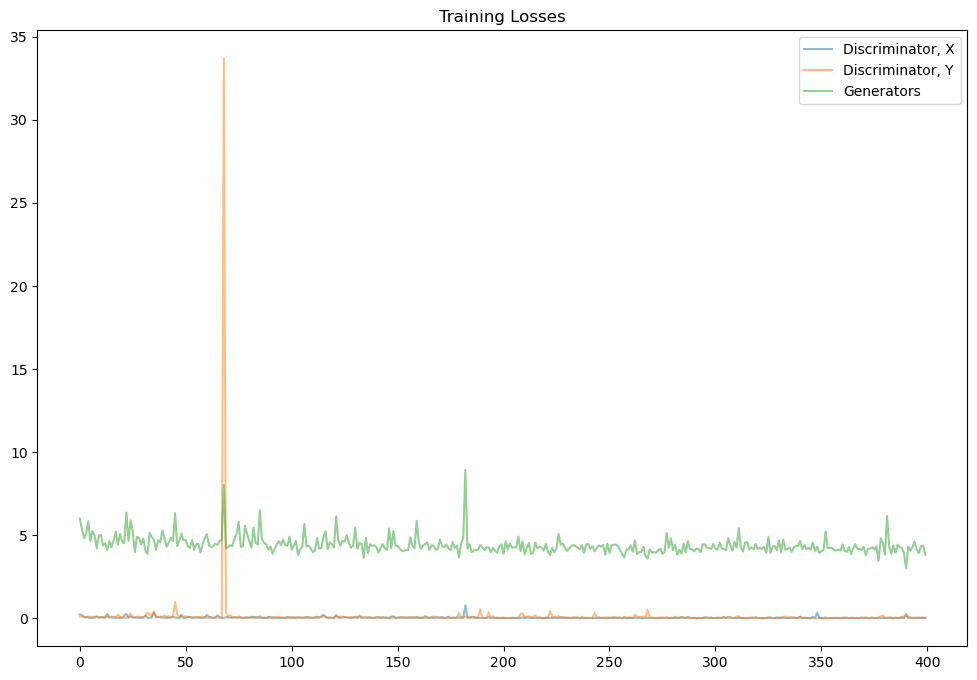

In [30]:
fig, ax = plt.subplots(figsize=(12,8))
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator, X', alpha=0.5)
plt.plot(losses.T[1], label='Discriminator, Y', alpha=0.5)
plt.plot(losses.T[2], label='Generators', alpha=0.5)
plt.title("Training Losses")
plt.legend()

---
## Evaluate the Result!


In [31]:
import matplotlib.image as mpimg

# helper visualization code
def view_samples(iteration, sample_dir='samples_cyclegan'):
    
    # samples are named by iteration
    path_XtoY = os.path.join(sample_dir, 'sample-{:06d}-X-Y.png'.format(iteration))
    path_YtoX = os.path.join(sample_dir, 'sample-{:06d}-Y-X.png'.format(iteration))
    
    # read in those samples
    try: 
        x2y = mpimg.imread(path_XtoY)
        y2x = mpimg.imread(path_YtoX)
    except:
        print('Invalid number of iterations.')
    
    fig, (ax1, ax2) = plt.subplots(figsize=(18,20), nrows=2, ncols=1, sharey=True, sharex=True)
    ax1.imshow(x2y)
    ax1.set_title('X to Y')
    ax2.imshow(y2x)
    ax2.set_title('Y to X')


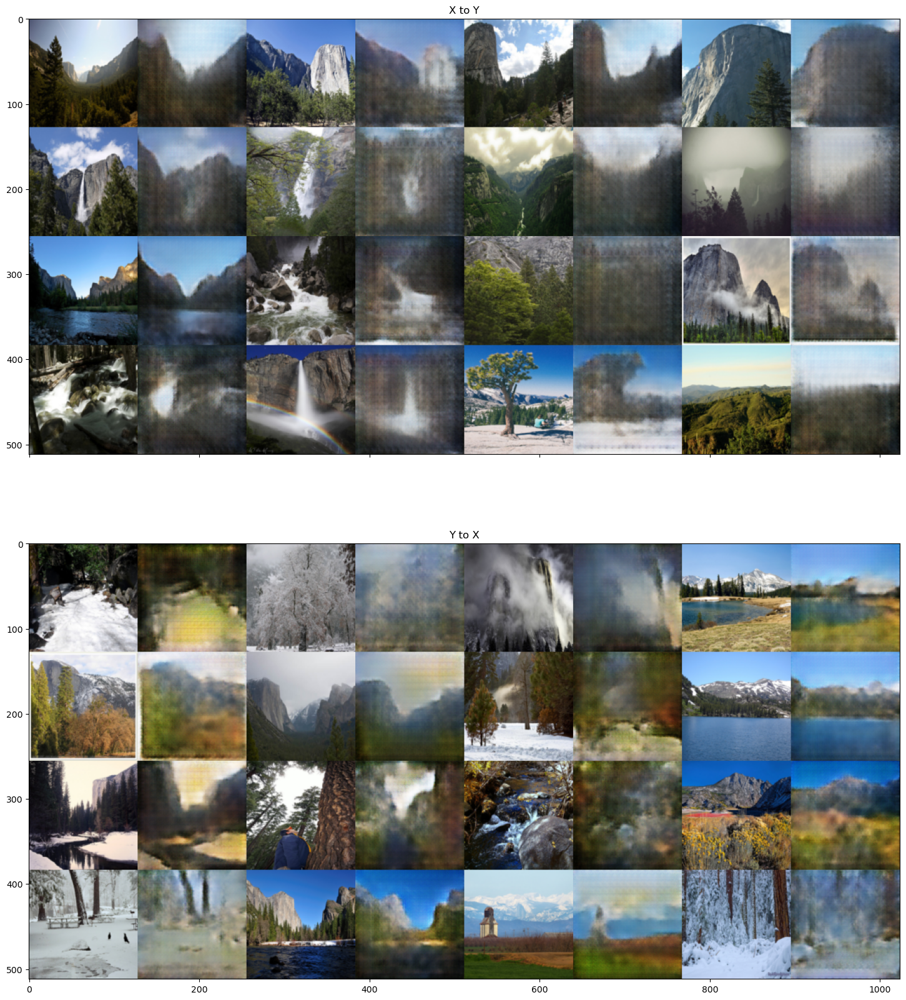

In [32]:
# view samples at iteration 100
view_samples(100, 'samples_cyclegan')

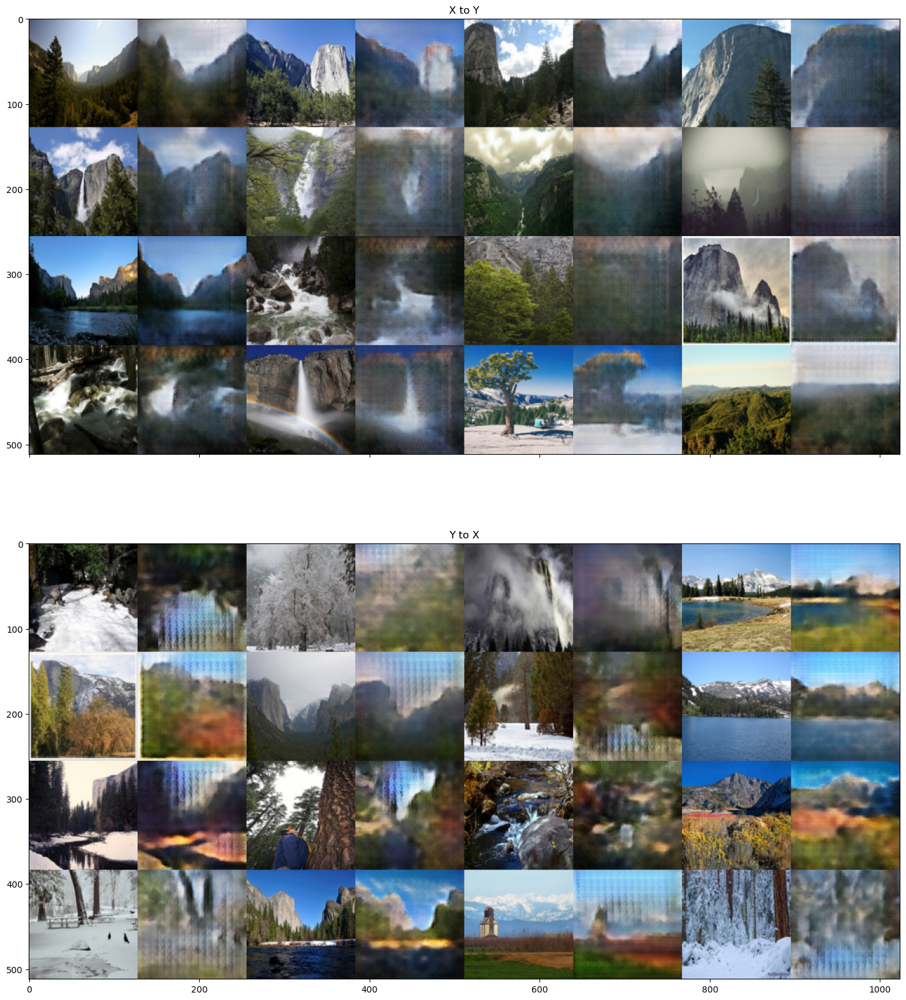

In [38]:
# view samples at iteration 4000
view_samples(1000, 'samples_cyclegan')

---
## Further Challenges and Directions

* One shortcoming of this model is that it produces fairly low-resolution images; this is an ongoing area of research; you can read about a higher-resolution formulation that uses a multi-scale generator model, in [this paper](https://arxiv.org/abs/1711.11585).
* Relatedly, we may want to process these as larger (say 256x256) images at first, to take advantage of high-res data.
* It may help your model to converge faster, if you initialize the weights in your network.
* This model struggles with matching colors exactly. This is because, if $G_{YtoX}$ and $G_{XtoY}$ may change the tint of an image; the cycle consistency loss may not be affected and can still be small. You could choose to introduce a new, color-based loss term that compares $G_{YtoX}(y)$ and $y$, and $G_{XtoY}(x)$ and $x$, but then this becomes a supervised learning approach. 
* This unsupervised approach also struggles with geometric changes, like changing the apparent size of individual object in an image, so it is best suited for stylistic transformations.
* For creating different kinds of models or trying out the Pix2Pix Architecture, [this Github repository](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/) which implements CycleGAN *and* Pix2Pix in PyTorch is a great resource.

**Once you are satified with your model, you are ancouraged to test it on a different dataset to see if it can find different types of mappings!**

---

### Different datasets for download

You can download a variety of datasets used in the Pix2Pix and CycleGAN papers, by following instructions in the [associated Github repository](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/blob/master/README.md). You'll just need to make sure that the data directories are named and organized correctly to load in that data.